In [36]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from mpl_toolkits.axes_grid1 import make_axes_locatable

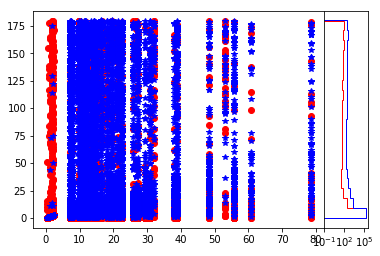

In [37]:
real = pd.read_csv('Predicted_Position_Cross_FIRST.csv')
fake = pd.read_csv('Predicted_Position_Cross_Fake_FIRST.csv')

fig, ax = plt.subplots(1,1)

ax.plot(real['pred_sep']*3600., real['Separation'], 'ro')
ax.plot(fake['fake_sep']*3600., fake['Separation'], 'b*')

divider = make_axes_locatable(ax)
ax_right = divider.append_axes('right', size='15%')

ax_right.hist(real['Separation']*3600., histtype='step', log=True, bins=20, color='red', orientation='horizontal')
ax_right.hist(fake['Separation']*3600., histtype='step', log=True, bins=20, color='blue', orientation='horizontal')
ax_right.yaxis.set_ticks([])
fig.show()

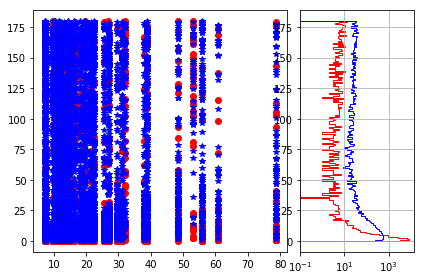

In [38]:
real = real[real['pred_sep'] > 5/3600].copy()
fake = fake[fake['fake_sep'] > 5/3600].copy()


fig, ax = plt.subplots(1,1)

ax.plot(real['pred_sep']*3600., real['Separation'], 'ro')
ax.plot(fake['fake_sep']*3600., fake['Separation'], 'b*')

divider = make_axes_locatable(ax)
ax_right = divider.append_axes('right', size='45%', pad='5%', sharey=ax)

ax_right.hist(real['Separation'], histtype='step', bins=200, log=True, color='red', orientation='horizontal')
ax_right.hist(fake['Separation'], histtype='step', bins=200, log=True, color='blue', orientation='horizontal')
# ax_right.yaxis.set_ticks([])
ax_right.xaxis.grid()
ax_right.yaxis.grid()

fig.tight_layout()
fig.show()

/Users/gal16b/miniconda3/envs/pink_e3/lib/python3.7/site-packages/matplotlib/figure.py:445: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  % get_backend())


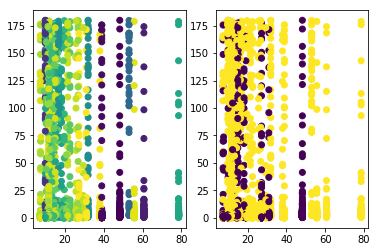

In [40]:
fig, (ax1, ax2) = plt.subplots(1,2)

ax1.scatter(real['pred_sep']*3600., real['Separation'], c=real['bmu_index'])
ax2.scatter(real['pred_sep']*3600., real['Separation'], c=real['click_count'])

fig.show()

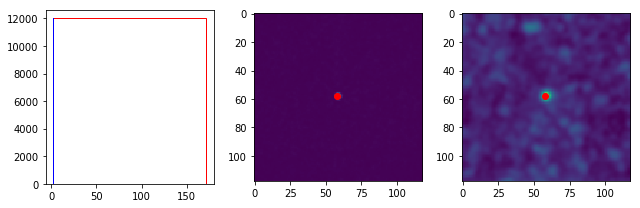

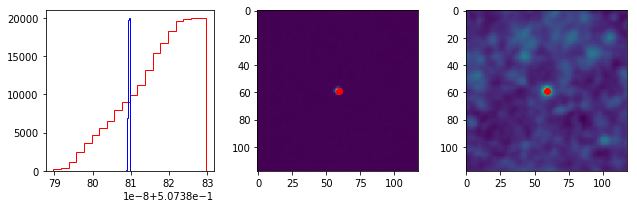

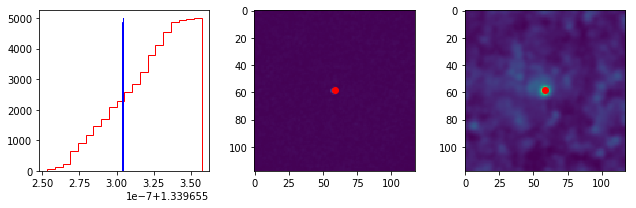

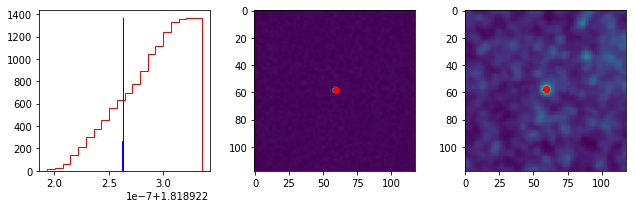

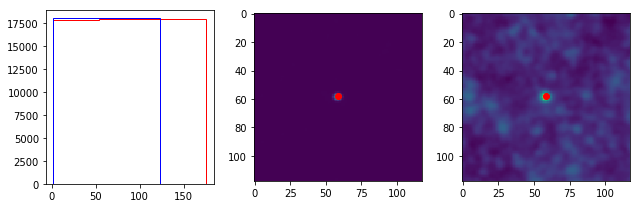

...

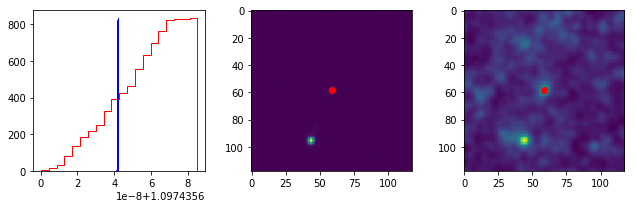

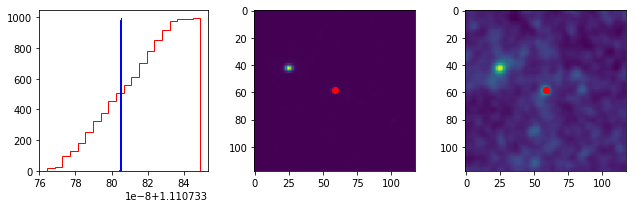

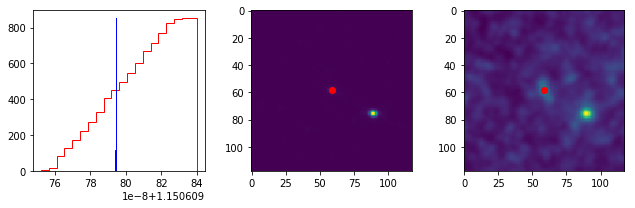

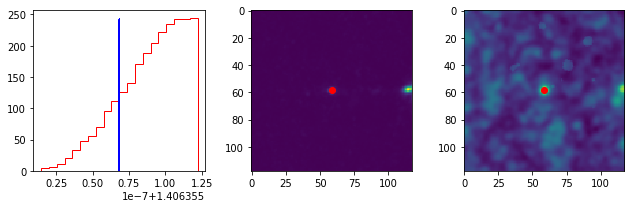

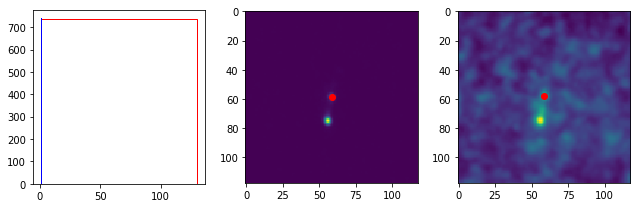

In [56]:
plt.close()

import pickle
from ast import literal_eval

real = pd.read_csv('Predicted_Position_Cross_FIRST.csv')
fake = pd.read_csv('Predicted_Position_Cross_Fake_FIRST.csv')

with open('../Small/FIRST_F1W1_95_5_L1_SOM_Small_5_Features-table.pkl', 'rb') as infile:
    annotations = pickle.load(infile)

ls = {0:'-', 1:'--', 2:':'}
    
for index, sub_real in real.groupby('bmu_pos'):
    fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(9,3))
    
    for index2, click_real in sub_real.groupby('click_count'):
        sub_fake = fake[(fake['bmu_pos']==index) & (fake['click_count']==index2)]

        ax1.hist(click_real['Separation'], histtype='step', ls=ls[index2], color='red', 
                 bins=20, label=f"{index2} Real = {click_real.shape[0]}",
                cumulative=True)
        ax1.hist(sub_fake['Separation'], histtype='step', ls=ls[index2], color='blue', 
                 bins=20, label=f"{index2} Fake = {sub_fake.shape[0]}",
                cumulative=True)
        
#     ax1.legend()
#     ax1.set(title=f"Real = {sub_real.shape[0]}, Fake = {sub_fake.shape[0]}")
    
    bmu_pos = literal_eval(index)
    ant = annotations[(bmu_pos[1], bmu_pos[0], 0)]
    
    ax2.imshow(ant.transform_neuron(channel=0))
    ax3.imshow(ant.transform_neuron(channel=1))
    
    for (ax, c) in zip([ax2,ax3],(0,1)):
        clicks = np.array(ant.transform_clicks(channel=c, center=False))
        ax.plot(clicks[:,0],clicks[:,1], 'ro')
    
    fig.tight_layout()
    fig.show()

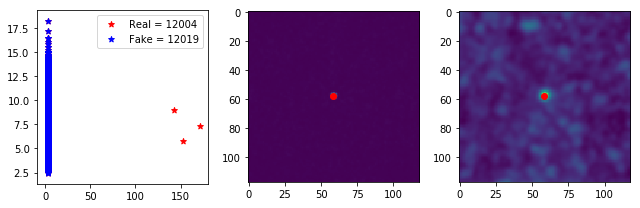

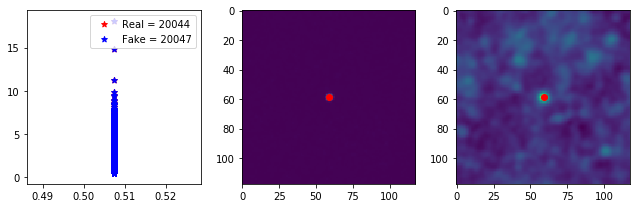

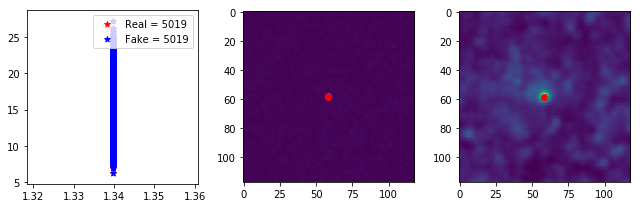

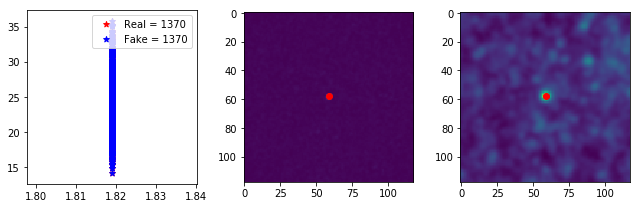

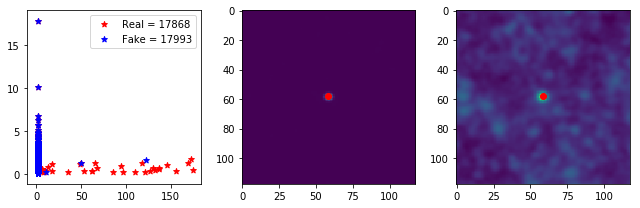

...

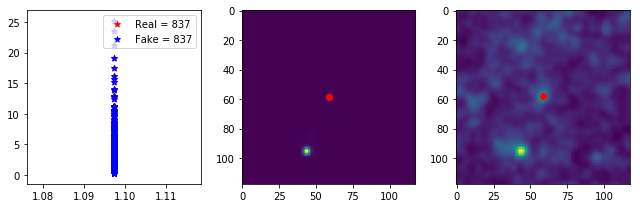

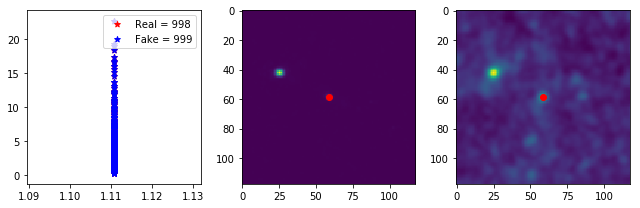

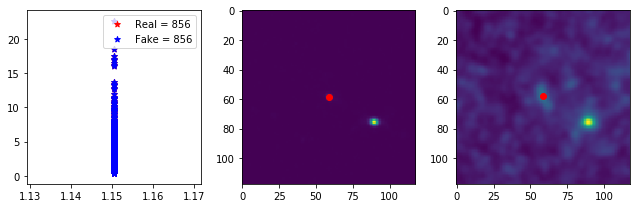

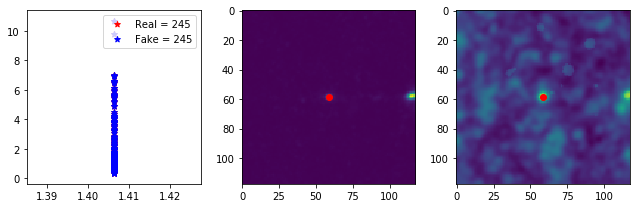

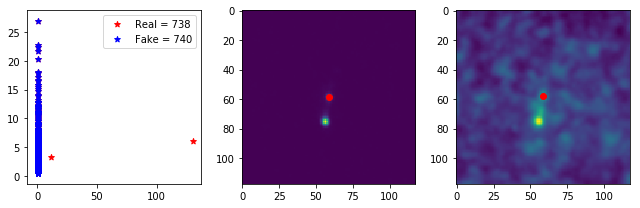

In [59]:
plt.close()

import pickle
from ast import literal_eval

real = pd.read_csv('Predicted_Position_Cross_FIRST.csv')
fake = pd.read_csv('Predicted_Position_Cross_Fake_FIRST.csv')

with open('../Small/FIRST_F1W1_95_5_L1_SOM_Small_5_Features-table.pkl', 'rb') as infile:
    annotations = pickle.load(infile)

ms = {0:'*',1:'o'}
    
for index, sub_real in real.groupby('bmu_pos'):
    fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(9,3))
    
    for index2, click_real in sub_real.groupby('click_count'):
        sub_fake = fake[(fake['bmu_pos']==index) & (fake['click_count']==index2)]

        ax1.scatter(click_real['Separation'],click_real['bmu_ed'], marker=ms[index2], color='red', label=f"Real = {sub_real.shape[0]}")
        ax1.scatter(sub_fake['Separation'],sub_fake['bmu_ed'], marker=ms[index2], color='blue', label=f"Fake = {sub_fake.shape[0]}")

#     ax1.hist(sub_fake['Separation'], histtype='step', color='blue', bins=20, label=f"Fake = {sub_fake.shape[0]}")
    ax1.legend()
#     ax1.set(title=f"Real = {sub_real.shape[0]}, Fake = {sub_fake.shape[0]}")
    
    bmu_pos = literal_eval(index)
    ant = annotations[(bmu_pos[1], bmu_pos[0], 0)]
    
    ax2.imshow(ant.transform_neuron(channel=0))
    ax3.imshow(ant.transform_neuron(channel=1))
    
    for (ax, c) in zip([ax2,ax3],(0,1)):
        clicks = np.array(ant.transform_clicks(channel=c, center=False))
        ax.plot(clicks[:,0],clicks[:,1], 'ro')
    
    fig.tight_layout()
    fig.show()